In [35]:
import numpy as np
import pandas as pd
import math
import statistics
import scipy as sp
from scipy import stats
import statsmodels.api as sm

t-table https://s3.amazonaws.com/udacity-hosted-downloads/t-table.jpg

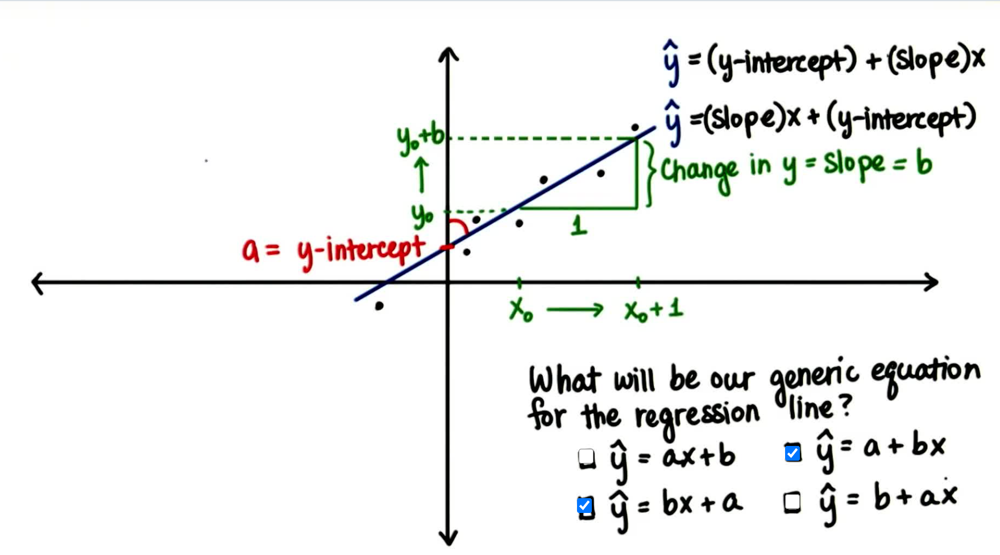

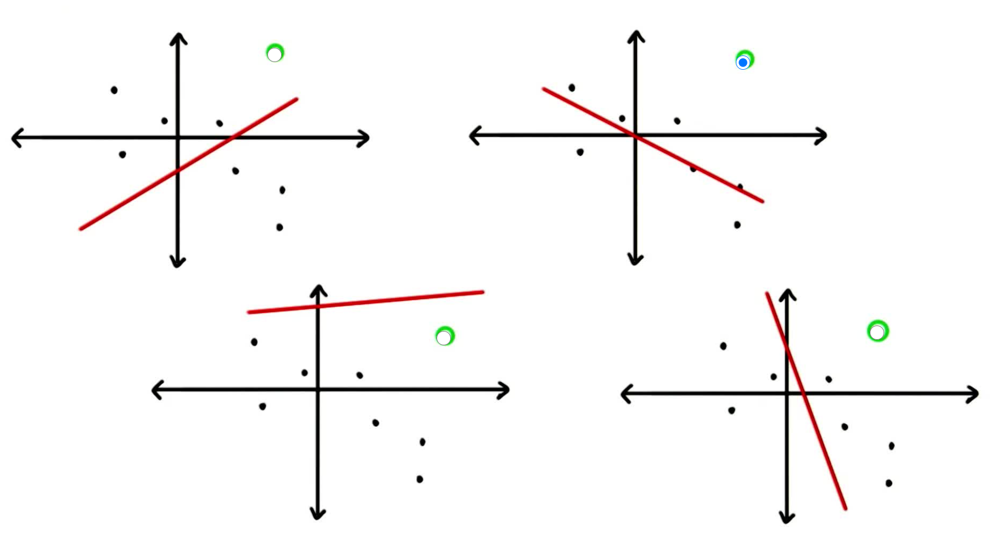

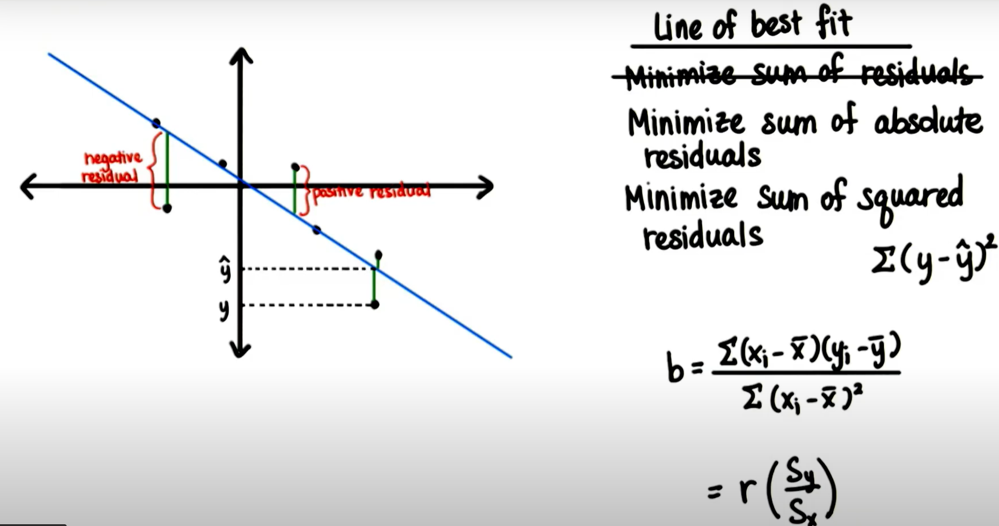

# Calculate slope! b(slope) = r(Sy/Sx) 

* b = r(standard deviation of y-values)/(standard deviation of x-values)
* y = r(standard deviation of y-values)/(standard deviation of x-values)x + a

* Noted: y = bx + a, where b represents the slope and a represents the y-intercept.

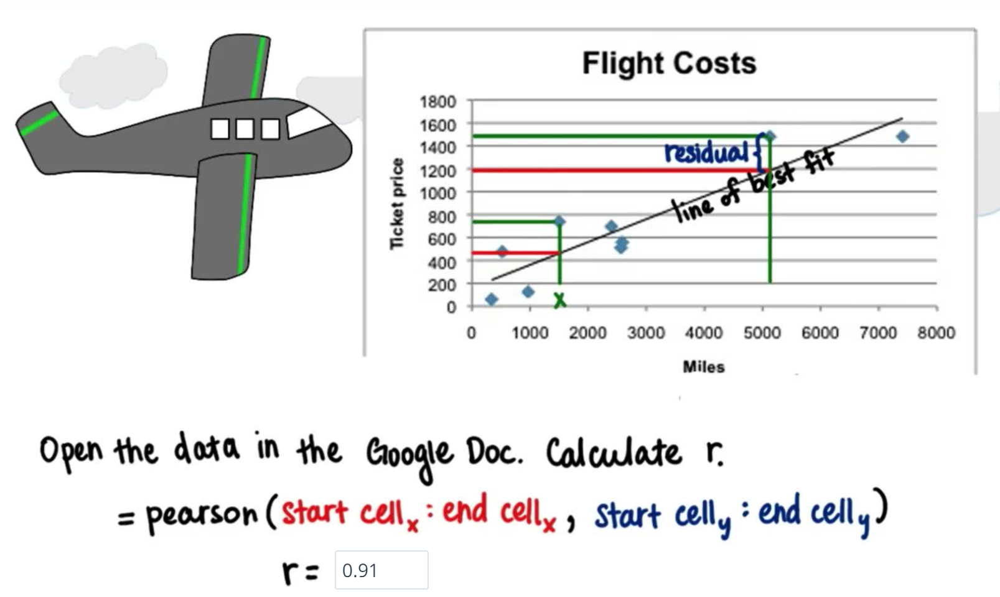

In [2]:
flight =pd.read_excel("Flight_Costs.xlsx")
flight

,Distance (miles),Cost (USD)
0,337,59.50
1,2565,509.50
2,967,124.50
3,5124,1480.40
4,2398,696.23
5,2586,559.50
6,7412,1481.50
7,522,474.50
8,1499,737.50


In [4]:
pearsonr, pvalue = sp.stats.pearsonr(flight["Distance (miles)"],flight["Cost (USD)"])
pearsonr, pvalue

(0.9090036493537198, 0.0006840064730744034)

In [10]:
pearsonr = np.round(pearsonr,decimals=2)
pearsonr

0.91

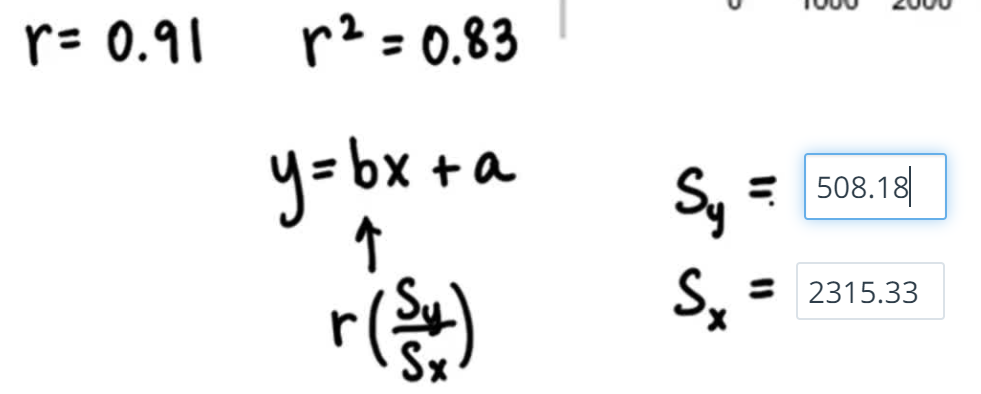

In [8]:
standard_dev_x=flight["Distance (miles)"].std()
standard_dev_x

2315.336824548668

In [9]:
standard_dev_y=flight["Cost (USD)"].std()
standard_dev_y

508.1870022879811

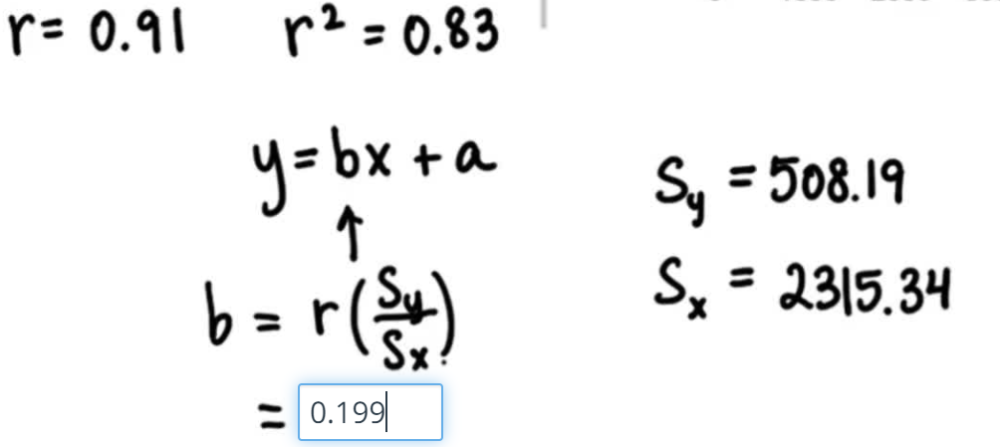

In [11]:
b = pearsonr*(standard_dev_y/standard_dev_x)
b

0.1997334328115344

In [18]:
# "stats.linregress(x,y)"" takes only array types of x and y. 
# convert df type to numpy array

In [37]:
x=flight["Distance (miles)"].values
x

array([ 337, 2565,  967, 5124, 2398, 2586, 7412,  522, 1499], dtype=int64)

In [54]:
y=flight["Cost (USD)"].values
y

array([  59.5 ,  509.5 ,  124.5 , 1480.4 ,  696.23,  559.5 , 1481.5 ,
        474.5 ,  737.5 ])

In [17]:
slope, intercept, r_value, p_value, std_err = stats.linregress(x,y)
slope, intercept, r_value, p_value, std_err 

(0.19951474650948434,
 161.38775380144125,
 0.9090036493537198,
 0.0006840064730744036,
 0.03457607734451205)

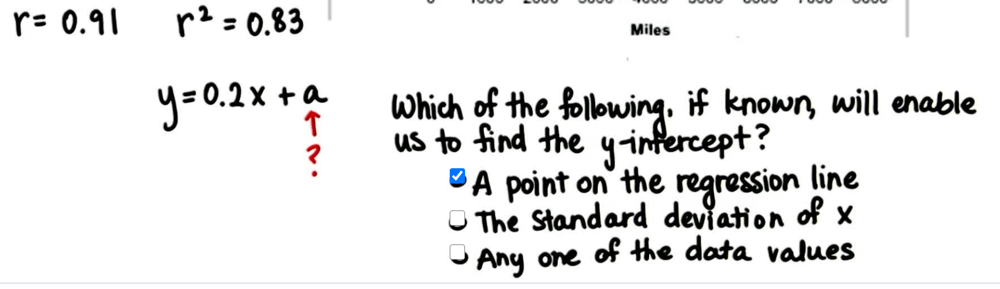

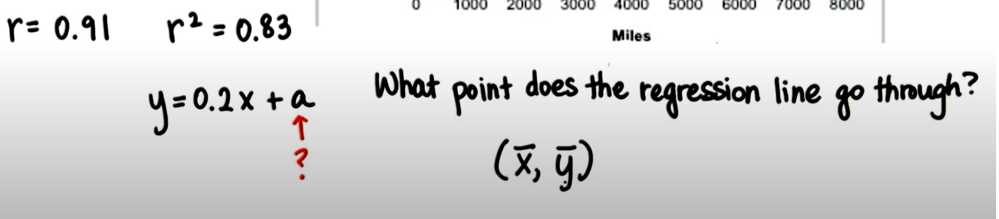

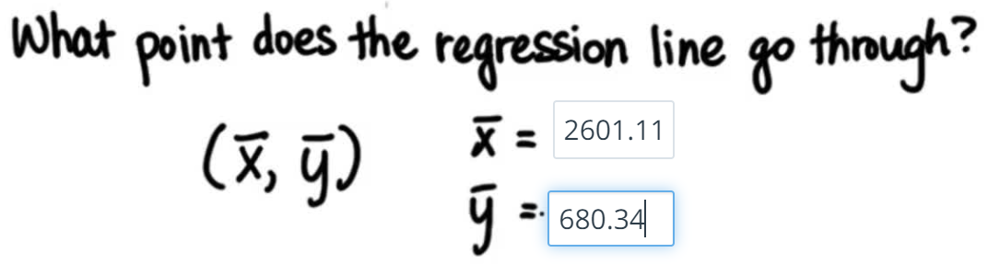

In [19]:
x.mean()

2601.1111111111113

In [20]:
y.mean()

680.3477777777778

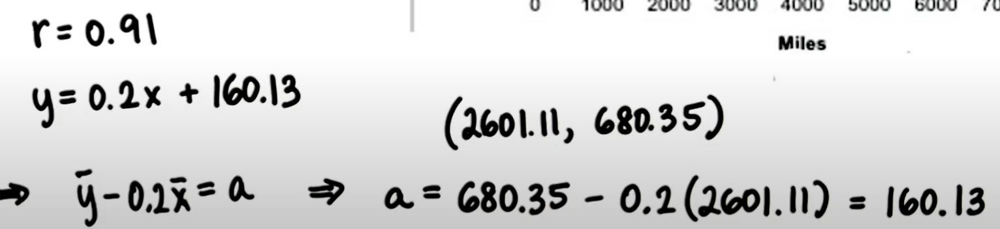

In [22]:
# b(slope)0.199 is rounded = 0.2 
b=0.2

In [23]:
y_intercept = y.mean()-b*x.mean()
y_intercept

160.12555555555548

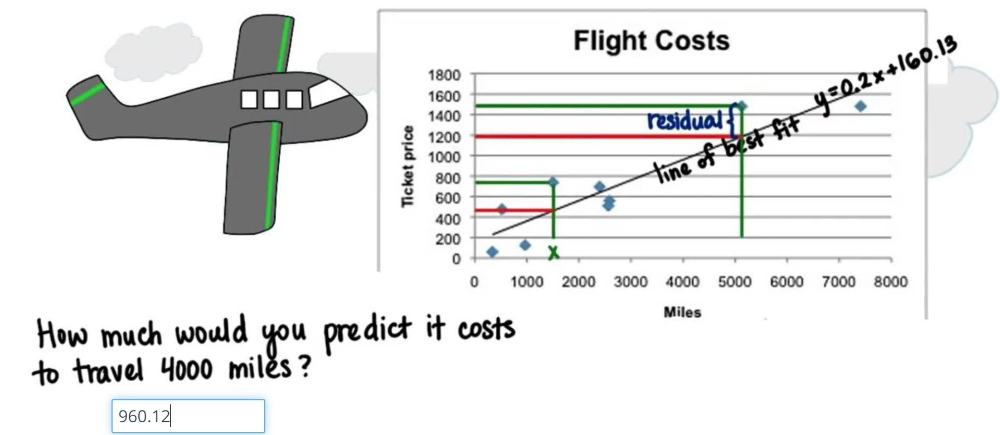

In [53]:
# y = bx + a = y = slope * x + y_intercept
y_hat=b*4000 + y_intercept
y_hat

960.1255555555555

In [29]:
0.2*1000

200.0

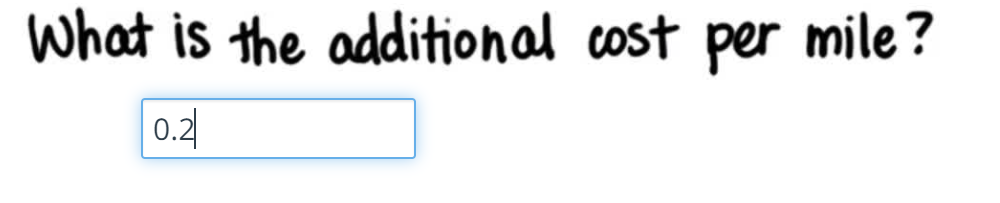

* b is slope and every time x increase, y moves b.

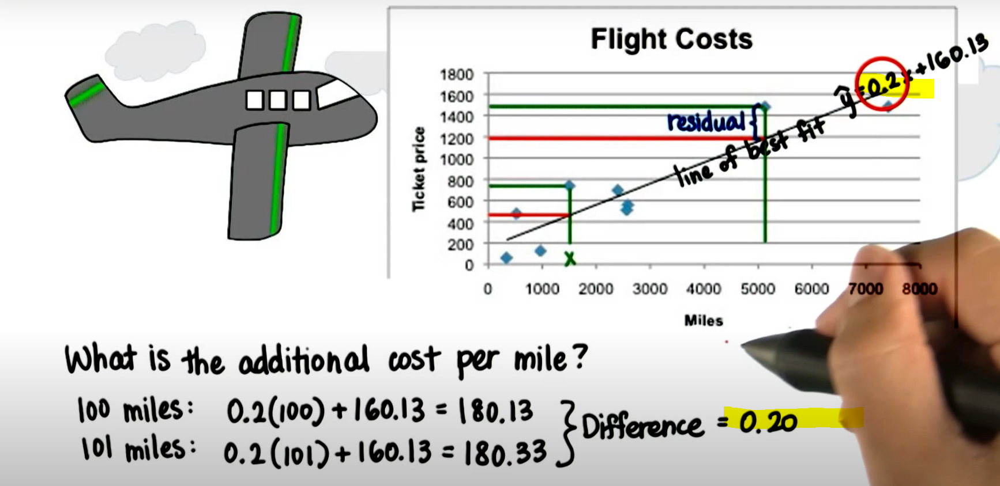

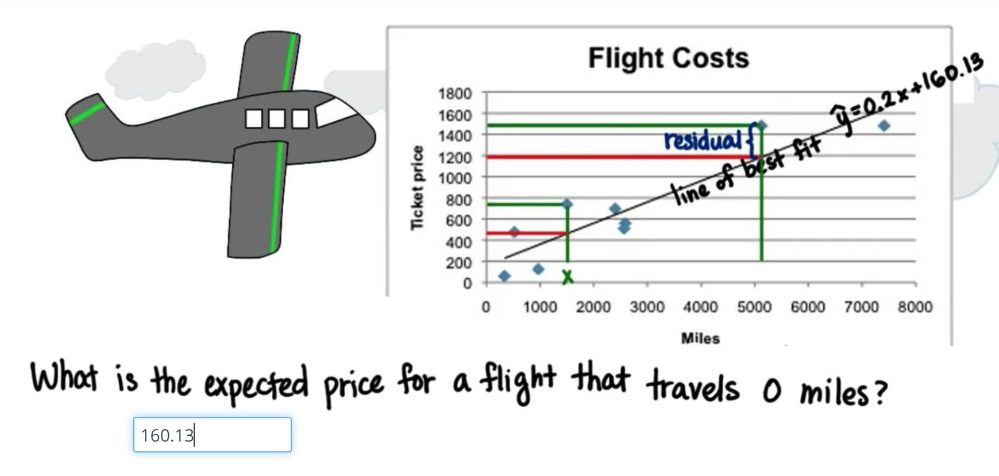

* y_intercept is where x is zero.
* y_intercept is "starting price".

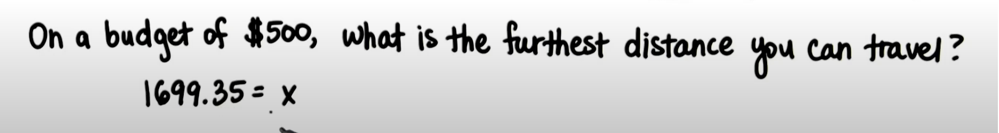

In [38]:
# y = bx + a 
# y = 0.2x * y_intercept
# 500 = 0.2*x+y_intercept
# 500-y_intercept = 0.2x
# 339.87 = 0.2x
# 339.87/0.2 = x
x1 =339.87/0.2 
x1

1699.35

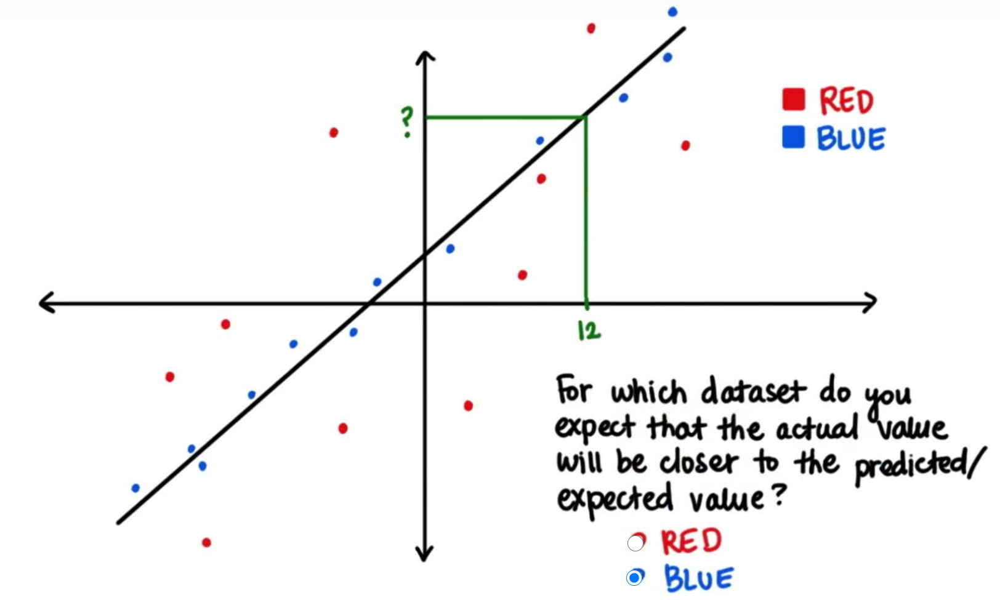

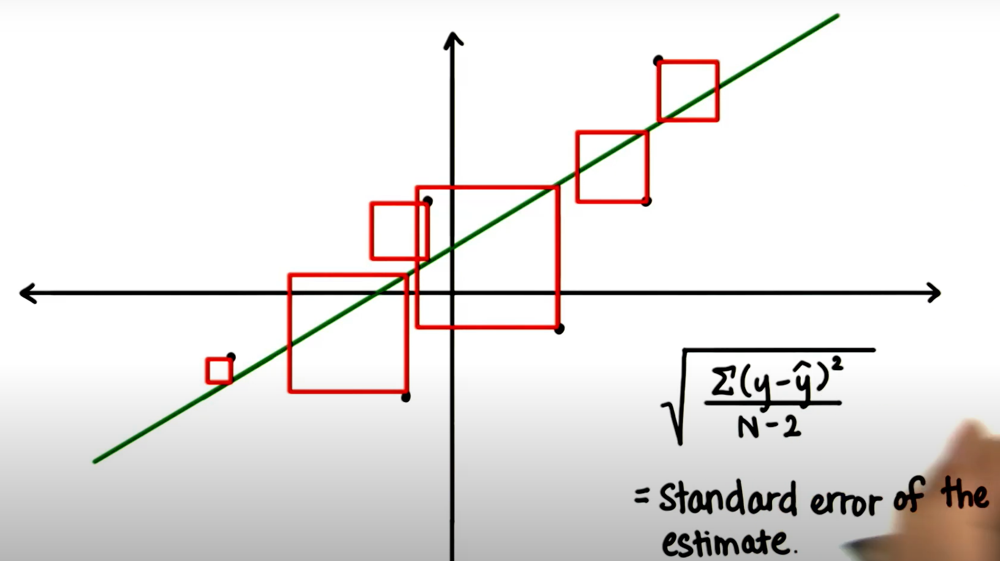

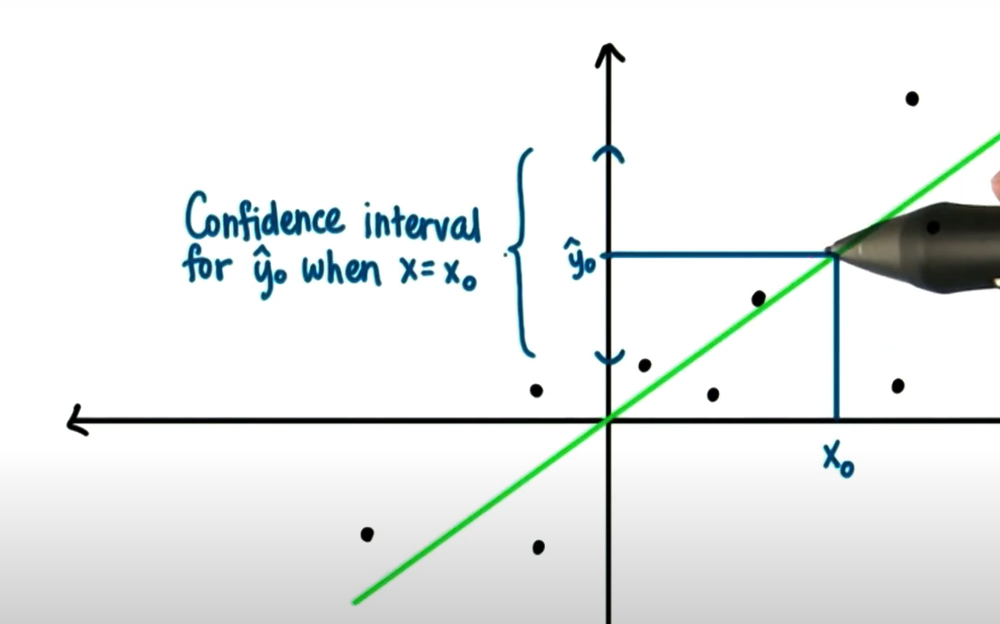


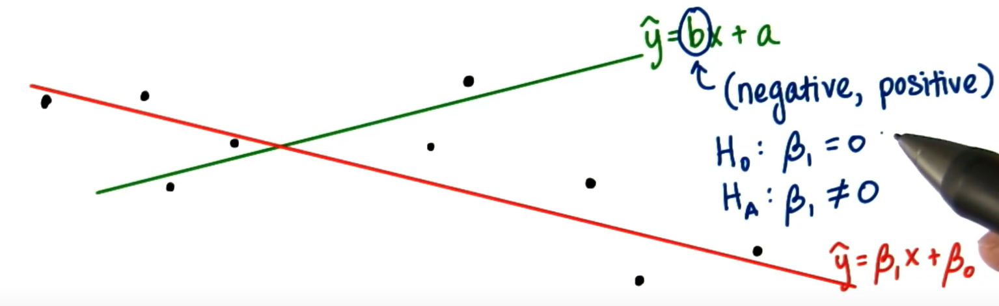

* red line is a "true" regression line. 
* green is a sample line.
* When sample line is positive but true regression is negative, **confidence interval** for **b** has **negative lower bound** and **positive upper bound**. This range **include ZERO**.
* if two tailed test. it will be **"failed to reject Ho"**.That means **"there is no liner relationshop between x and y samples"**.


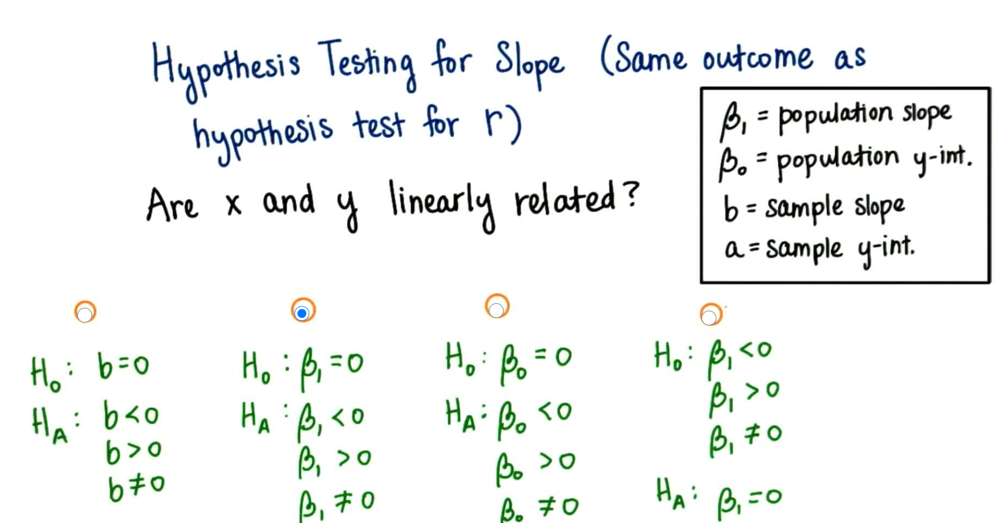

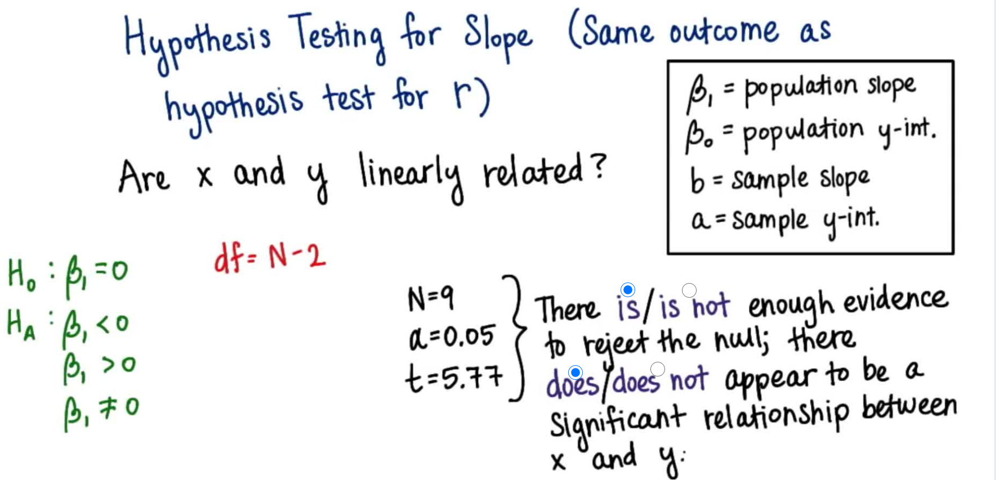

* t-table https://s3.amazonaws.com/udacity-hosted-downloads/t-table.jpg 
* t_critical =2.365 (N-2 = 7(df), non directional test = 2 tailed test, alpha = 0.25)

* You need to add the column of ones to the inputs if you want statsmodels to calculate the intercept 𝑏₀. It doesn’t takes 𝑏₀ into account by default. This is just one function call:
#### x = sm.add_constant(x)
* reference https://realpython.com/linear-regression-in-python/
* docs for "tatsmodels.regression.linear_model.OLS" https://www.statsmodels.org/stable/generated/statsmodels.regression.linear_model.OLS.html

In [55]:
x = sm.add_constant(x)

In [56]:
# note! notice that the first argument is the output, followed with the input.
# x and y needs to be array type
model = sm.OLS(y, x)

In [57]:
results = model.fit()

In [58]:
results.summary()

C:\Users\yuka\Anaconda3\lib\site-packages\scipy\stats\stats.py:1535: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=9
  "anyway, n=%i" % int(n))


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.826
Model:                            OLS   Adj. R-squared:                  0.801
Method:                 Least Squares   F-statistic:                     33.30
Date:                Fri, 15 Jan 2021   Prob (F-statistic):           0.000684
Time:                        16:01:35   Log-Likelihood:                -60.441
No. Observations:                   9   AIC:                             124.9
Df Residuals:                       7   BIC:                             125.3
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        161.3878    117.411      1.375      0.212    -116.244     439.020
x1             0.1995      0.035      5.770      0.001       0.118       0.281
==============================================================================
Omnibus:                        3.351   Durbin-Watson:                   1.424
Prob(Omnibus):                  0.187   Jarque-Bera (JB):                1.162
Skew:                           0.414   Prob(JB):                        0.559
Kurtosis:                       1.447   Cond. No.                     5.28e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.28e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

* t value is 5.77 as it is high considering. 
* Whereas p value is really low, which is 0.001. That would lead to "reject Ho."

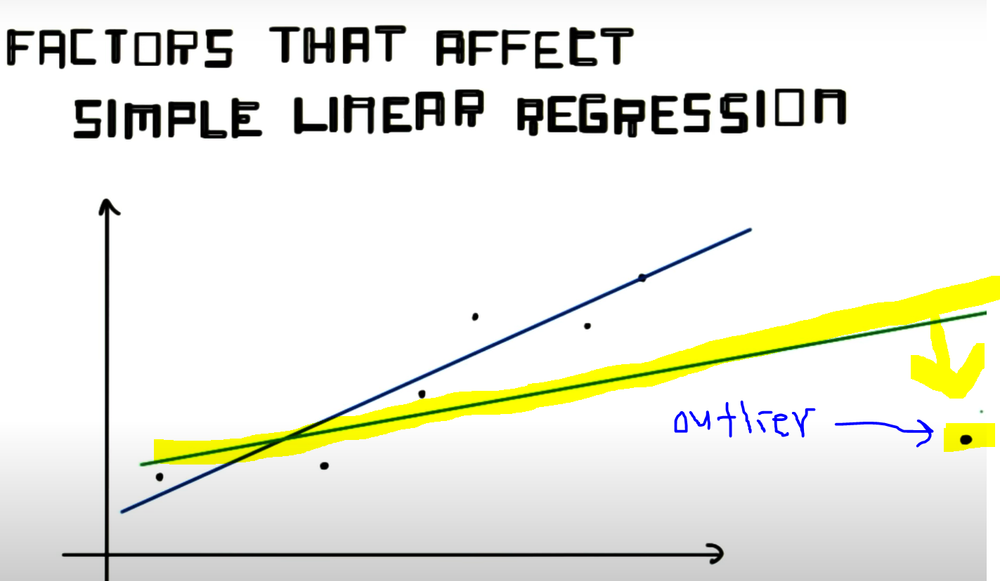


* outliner will affect simple liner regression.
* when you add a outlier and try to write regression line, the outlier will pull the regresison line donw.

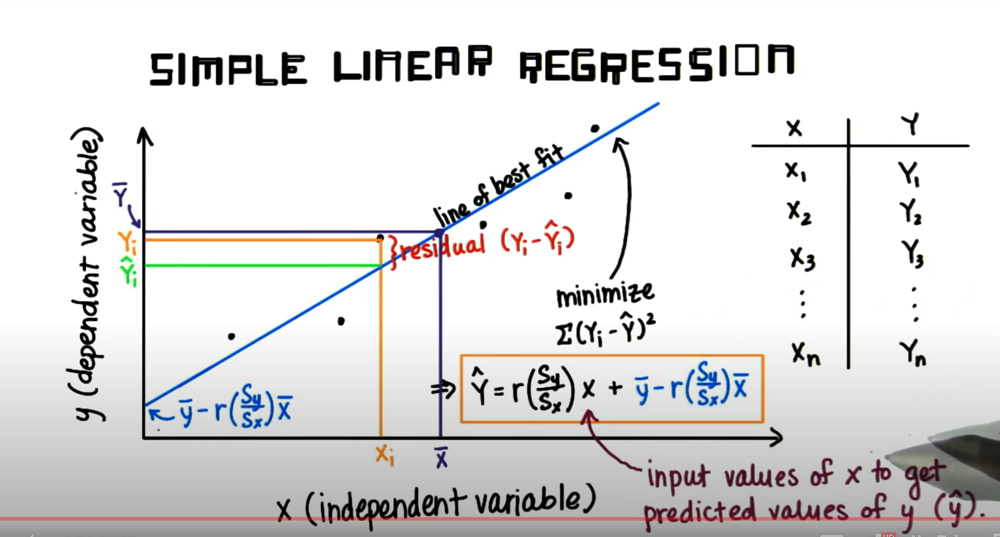

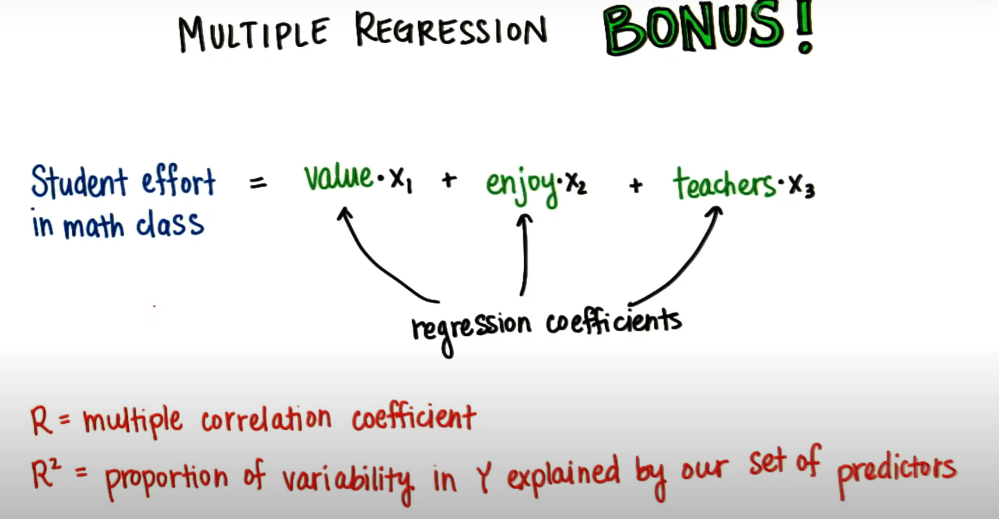

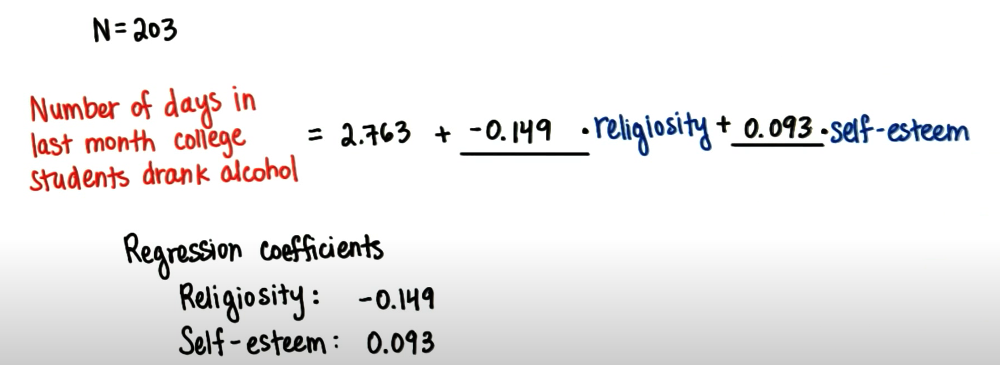

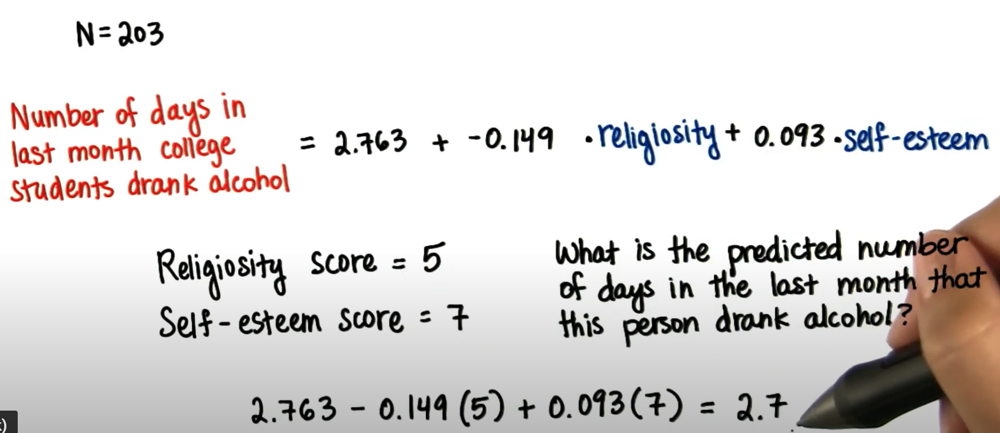

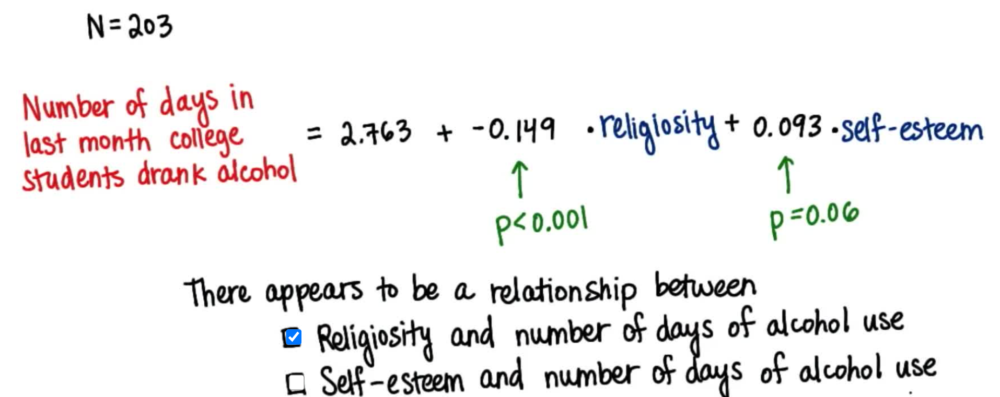

* The coefficient for self-esteem was not statistically significant, so we can't conclude there was a relationship between self-esteem and alcohol use.


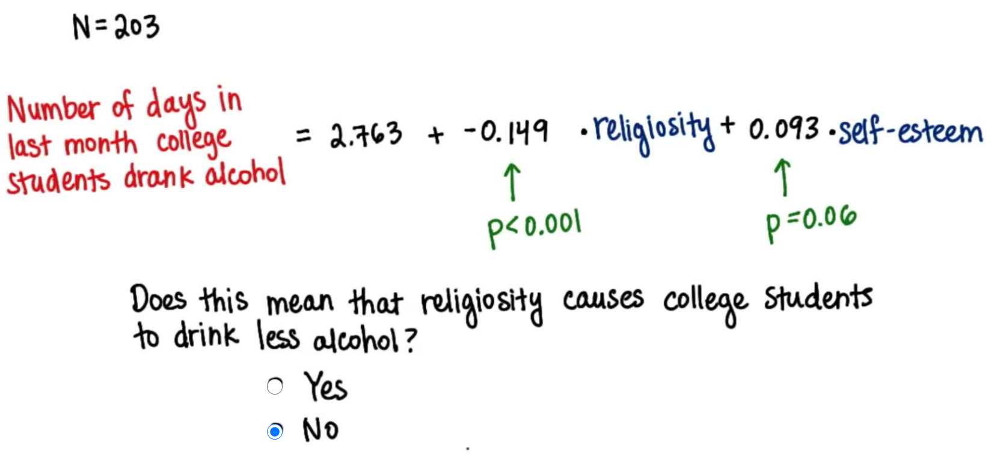

* We've only observed a **correlation! We can't conclude causation.**